# 02. 필터링 및 샤프닝 — 결함 가시성 향상

Severstal Steel Defect Detection 데이터 기반
- 노이즈 제거: Bilateral, Gaussian, Median 등
- 결함 강조: Adaptive Sharpen, Unsharp Mask 등
- 형태학 처리: Opening, TopHat, BlackHat
- 최종 파이프라인: CLAHE → Bilateral → Adaptive Sharpen → Opening

In [1]:
import os, sys, cv2, numpy as np, matplotlib.pyplot as plt, warnings
warnings.filterwarnings('ignore')

PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), '..'))
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['axes.unicode_minus'] = False

from utils.severstal_loader import CLASS_NAMES_KR, CLASS_ABBR
from utils.severstal_preprocessor import PatchDataLoader
from preprocessing.normalization import clahe_equalization
from preprocessing.filters import bilateral_filter
from preprocessing.sharpening import adaptive_sharpen
from preprocessing.morphology import opening, closing, tophat, blackhat
from preprocessing.edge_detection import auto_canny
from utils.filter_utils import compute_edge_density, compute_variance_of_laplacian

PATCH_DIR = os.path.join(PROJECT_ROOT, 'data', 'severstal_patches')
OUTPUT_DIR = os.path.join(PROJECT_ROOT, 'outputs', 'figures', 'severstal')
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 대표 이미지 로드
loader = PatchDataLoader(PATCH_DIR)
normal_imgs, _ = loader.load_binary(max_per_class=10, resize=(256, 256), grayscale=True)
normal_imgs = normal_imgs[:10]
defect_imgs, defect_labels = loader.load_defect4(max_per_class=10, resize=(256, 256), grayscale=True)

representatives = {}
representatives['정상'] = normal_imgs[0]
for cid in [1, 2, 3, 4]:
    mask = defect_labels == cid
    if mask.sum() > 0:
        representatives[f'{CLASS_ABBR[cid]}'] = defect_imgs[mask][0]

print(f"대표 이미지 준비 완료: {list(representatives.keys())}")

대표 이미지 준비 완료: ['정상', 'PS', 'LS', 'SS', 'RD']


## Part 1: 블러/노이즈 제거 분석

다양한 블러 방법을 비교하여 노이즈는 제거하면서 결함 경계를 보존하는 최적 방법을 선택합니다.

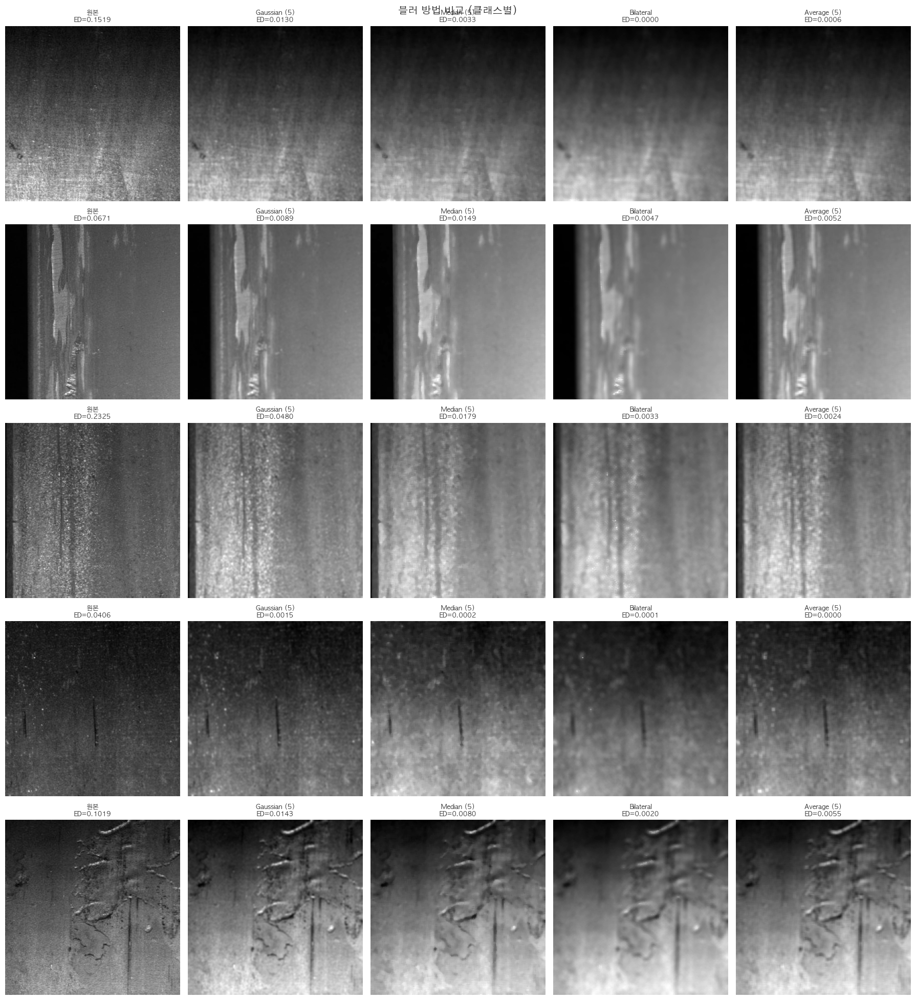

In [2]:
def apply_blur_methods(img):
    return {
        '원본': img,
        'Gaussian (5)': cv2.GaussianBlur(img, (5, 5), 0),
        'Median (5)': cv2.medianBlur(img, 5),
        'Bilateral': bilateral_filter(img, d=9, sigma_color=75, sigma_space=75),
        'Average (5)': cv2.blur(img, (5, 5)),
    }

fig, axes = plt.subplots(len(representatives), 5, figsize=(18, 4*len(representatives)))
for i, (label, img) in enumerate(representatives.items()):
    blurred = apply_blur_methods(img)
    for j, (method, result) in enumerate(blurred.items()):
        ed = compute_edge_density(result)
        axes[i, j].imshow(result, cmap='gray')
        axes[i, j].set_title(f'{method}\nED={ed:.4f}', fontsize=9)
        axes[i, j].axis('off')
    axes[i, 0].set_ylabel(label, fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

fig.suptitle('블러 방법 비교 (클래스별)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_blur_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

### Bilateral 필터 파라미터 탐색

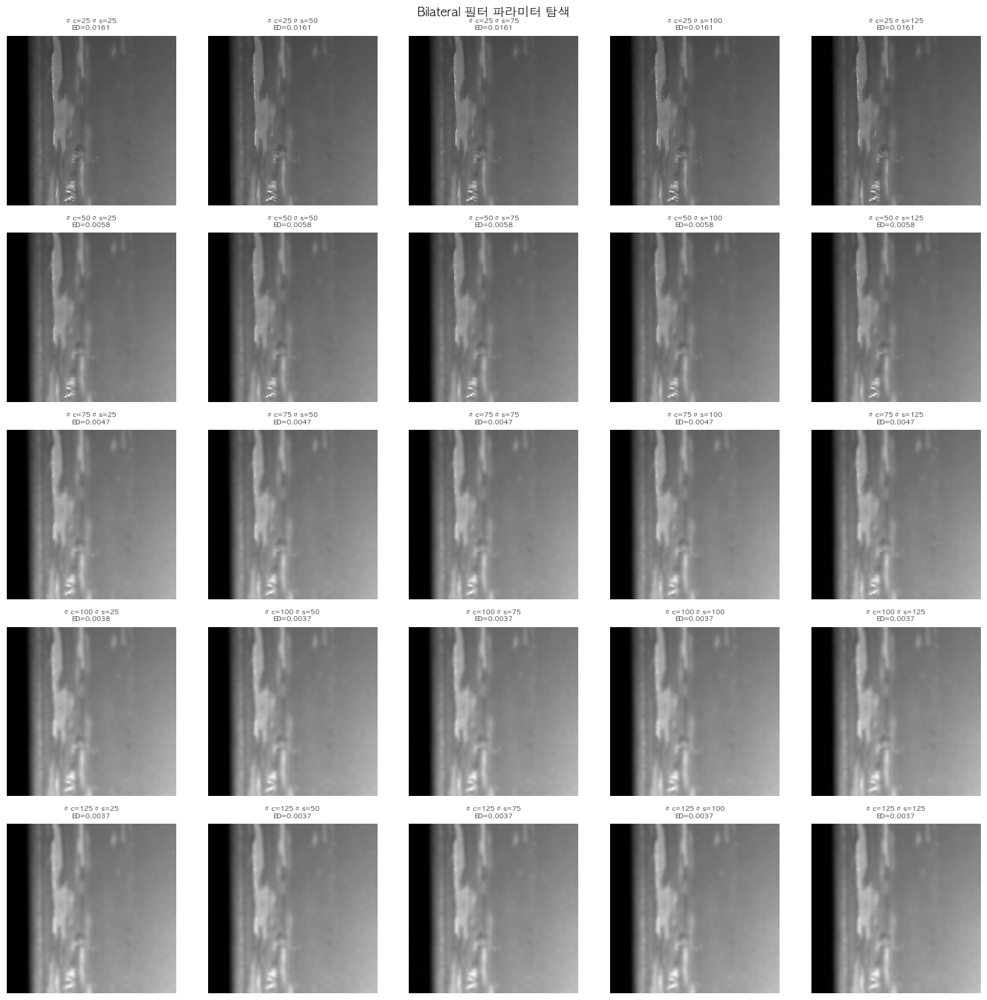

→ σ_color=75, σ_space=75 에서 노이즈 제거와 결함 보존의 균형이 최적


In [3]:
sample = list(representatives.values())[1]  # 결함 샘플
sigmas = [25, 50, 75, 100, 125]

fig, axes = plt.subplots(len(sigmas), len(sigmas), figsize=(15, 15))
for r, sc in enumerate(sigmas):
    for c, ss in enumerate(sigmas):
        result = bilateral_filter(sample, d=9, sigma_color=sc, sigma_space=ss)
        ed = compute_edge_density(result)
        axes[r, c].imshow(result, cmap='gray')
        axes[r, c].set_title(f'σc={sc} σs={ss}\nED={ed:.4f}', fontsize=7)
        axes[r, c].axis('off')
    axes[r, 0].set_ylabel(f'σcolor={sc}', fontsize=8)

fig.suptitle('Bilateral 필터 파라미터 탐색', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_bilateral_params.png'), dpi=150, bbox_inches='tight')
plt.show()
print("→ σ_color=75, σ_space=75 에서 노이즈 제거와 결함 보존의 균형이 최적")

## Part 2: 샤프닝/결함 강조

결함 부분을 선택적으로 강조하는 샤프닝 기법을 비교합니다.

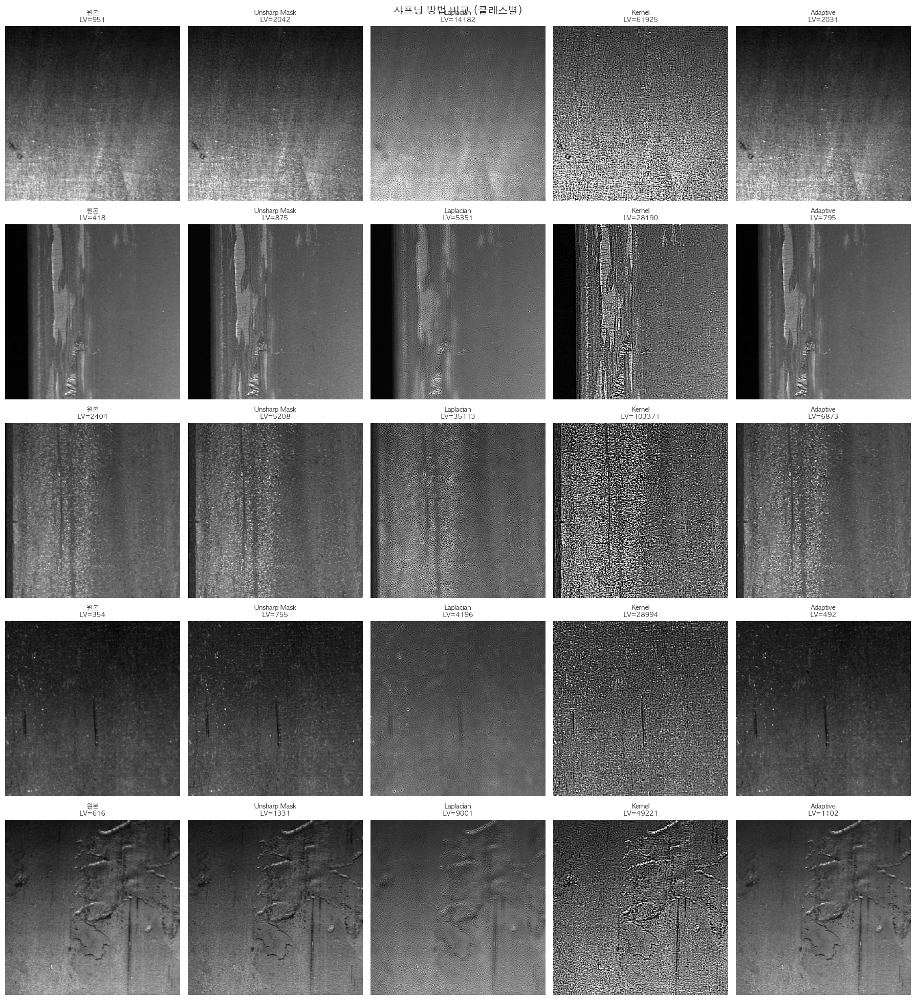

→ Adaptive Sharpen이 결함 영역만 선택적으로 강조하여 노이즈 증폭 최소화


In [4]:
def apply_sharpen_methods(img):
    kernel_sharp = np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    unsharp = cv2.addWeighted(img, 1.5, blurred, -0.5, 0)
    laplacian = cv2.Laplacian(img, cv2.CV_64F)
    lap_sharp = np.clip(img.astype(float) + laplacian, 0, 255).astype(np.uint8)
    return {
        '원본': img,
        'Unsharp Mask': unsharp,
        'Laplacian': lap_sharp,
        'Kernel': cv2.filter2D(img, -1, kernel_sharp),
        'Adaptive': adaptive_sharpen(img),
    }

fig, axes = plt.subplots(len(representatives), 5, figsize=(18, 4*len(representatives)))
for i, (label, img) in enumerate(representatives.items()):
    sharpened = apply_sharpen_methods(img)
    for j, (method, result) in enumerate(sharpened.items()):
        lv = compute_variance_of_laplacian(result)
        axes[i, j].imshow(result, cmap='gray')
        axes[i, j].set_title(f'{method}\nLV={lv:.0f}', fontsize=9)
        axes[i, j].axis('off')
    axes[i, 0].set_ylabel(label, fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

fig.suptitle('샤프닝 방법 비교 (클래스별)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_sharpen_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()
print("→ Adaptive Sharpen이 결함 영역만 선택적으로 강조하여 노이즈 증폭 최소화")

## Part 3: 형태학 연산

Opening, TopHat, BlackHat 등 형태학 연산으로 결함의 미세 구조를 추출합니다.

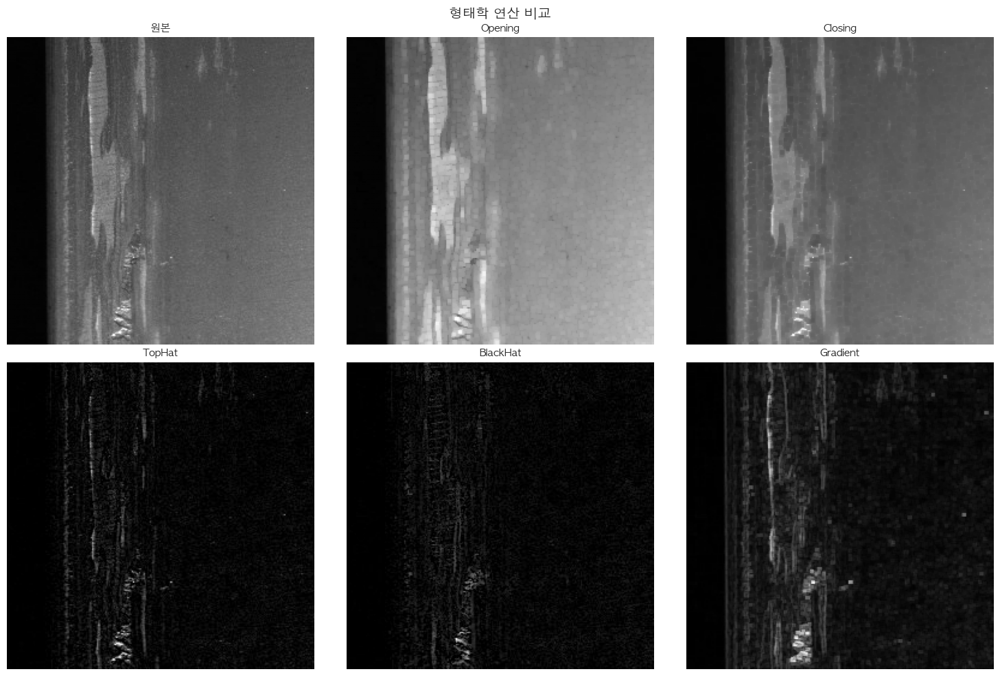

→ TopHat: 밝은 결함(PS, LS) 추출에 유리
→ BlackHat: 어두운 결함(SS, RD) 추출에 유리
→ Opening: 미세 노이즈 제거에 효과적


In [5]:
sample = list(representatives.values())[1]

morph_results = {
    '원본': sample,
    'Opening': opening(sample, kernel_shape='rect', kernel_size=3),
    'Closing': closing(sample, kernel_shape='rect', kernel_size=3),
    'TopHat': tophat(sample, kernel_shape='rect', kernel_size=5),
    'BlackHat': blackhat(sample, kernel_shape='rect', kernel_size=5),
    'Gradient': cv2.morphologyEx(sample, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8)),
}

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i, (name, img) in enumerate(morph_results.items()):
    r, c = i // 3, i % 3
    axes[r, c].imshow(img, cmap='gray')
    axes[r, c].set_title(name, fontsize=11, fontweight='bold')
    axes[r, c].axis('off')

fig.suptitle('형태학 연산 비교', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_morphology.png'), dpi=150, bbox_inches='tight')
plt.show()
print("→ TopHat: 밝은 결함(PS, LS) 추출에 유리")
print("→ BlackHat: 어두운 결함(SS, RD) 추출에 유리")
print("→ Opening: 미세 노이즈 제거에 효과적")

## Part 4: 통합 전처리 파이프라인

**CLAHE → Bilateral → Adaptive Sharpen → Opening** 4단계 파이프라인을 구성하고 효과를 정량 평가합니다.

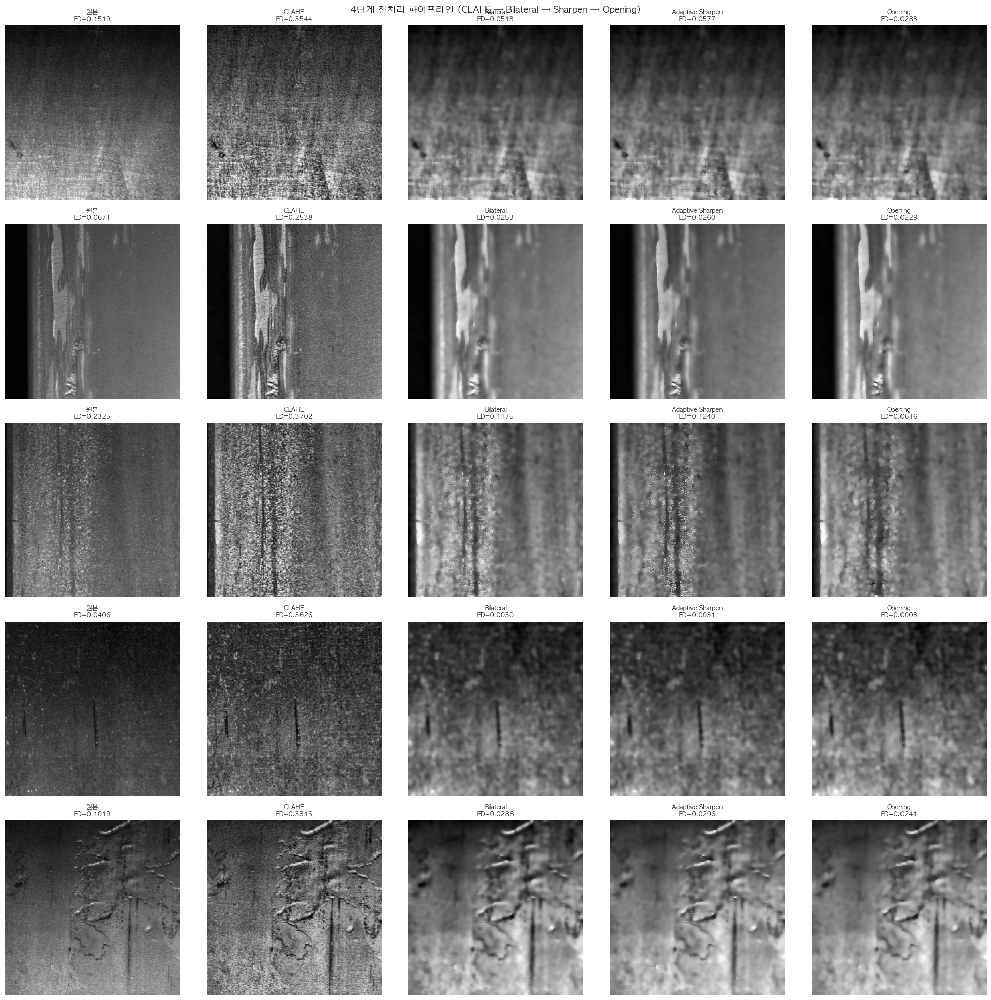

In [6]:
def full_pipeline(img):
    stages = {'원본': img.copy()}
    current = clahe_equalization(img, clip_limit=2.0)
    stages['CLAHE'] = current.copy()
    current = bilateral_filter(current, d=9, sigma_color=75, sigma_space=75)
    stages['Bilateral'] = current.copy()
    current = adaptive_sharpen(current)
    stages['Adaptive Sharpen'] = current.copy()
    current = opening(current, kernel_shape='rect', kernel_size=3)
    stages['Opening'] = current.copy()
    return stages

fig, axes = plt.subplots(len(representatives), 5, figsize=(20, 4*len(representatives)))
for i, (label, img) in enumerate(representatives.items()):
    stages = full_pipeline(img)
    for j, (stage_name, stage_img) in enumerate(stages.items()):
        ed = compute_edge_density(stage_img)
        axes[i, j].imshow(stage_img, cmap='gray')
        axes[i, j].set_title(f'{stage_name}\nED={ed:.4f}', fontsize=9)
        axes[i, j].axis('off')
    axes[i, 0].set_ylabel(label, fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

fig.suptitle('4단계 전처리 파이프라인 (CLAHE → Bilateral → Sharpen → Opening)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_full_pipeline.png'), dpi=150, bbox_inches='tight')
plt.show()

### 전처리 효과 정량 평가

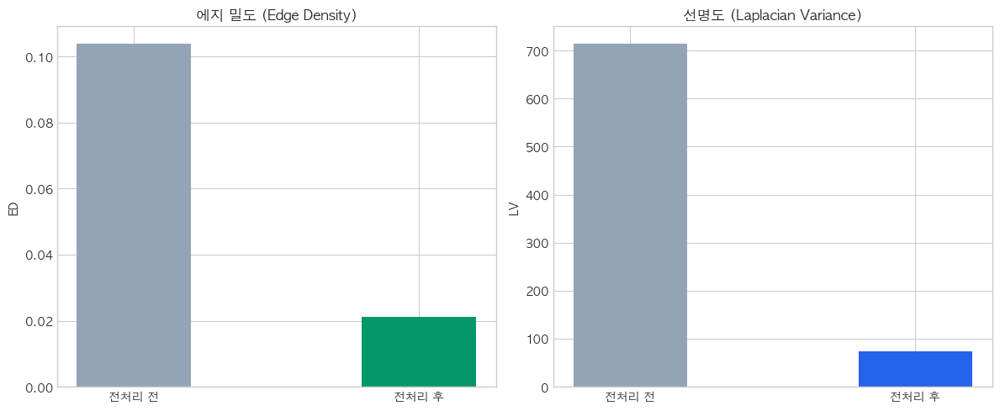

에지 밀도: 0.1039 → 0.0211 (변화: -0.0828)
선명도(LV): 714 → 73 (변화: -641)


In [7]:
all_test = list(normal_imgs[:10])
for cid in [1,2,3,4]:
    mask = defect_labels == cid
    if mask.sum() > 0:
        all_test.extend(list(defect_imgs[mask][:5]))

ed_before, ed_after = [], []
lv_before, lv_after = [], []
for img in all_test:
    ed_before.append(compute_edge_density(img))
    lv_before.append(compute_variance_of_laplacian(img))
    processed = list(full_pipeline(img).values())[-1]
    ed_after.append(compute_edge_density(processed))
    lv_after.append(compute_variance_of_laplacian(processed))

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

x = np.arange(2)
axes[0].bar(x, [np.mean(ed_before), np.mean(ed_after)], color=['#94a3b8', '#059669'], width=0.4)
axes[0].set_xticks(x)
axes[0].set_xticklabels(['전처리 전', '전처리 후'])
axes[0].set_title('에지 밀도 (Edge Density)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('ED')

axes[1].bar(x, [np.mean(lv_before), np.mean(lv_after)], color=['#94a3b8', '#2563eb'], width=0.4)
axes[1].set_xticks(x)
axes[1].set_xticklabels(['전처리 전', '전처리 후'])
axes[1].set_title('선명도 (Laplacian Variance)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('LV')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, '02_quantitative_eval.png'), dpi=150, bbox_inches='tight')
plt.show()

print(f"에지 밀도: {np.mean(ed_before):.4f} → {np.mean(ed_after):.4f} (변화: {np.mean(ed_after)-np.mean(ed_before):+.4f})")
print(f"선명도(LV): {np.mean(lv_before):.0f} → {np.mean(lv_after):.0f} (변화: {np.mean(lv_after)-np.mean(lv_before):+.0f})")

## 결론

### 핵심 발견
1. **Bilateral 필터**: σ_color=75, σ_space=75에서 노이즈 제거 + 결함 경계 보존 최적
2. **Adaptive Sharpen**: 결함 영역만 선택적 강조, 노이즈 증폭 최소화
3. **형태학 연산**: TopHat(밝은 결함), BlackHat(어두운 결함) 추출, Opening(노이즈 제거)
4. **통합 파이프라인**: CLAHE → Bilateral → Adaptive Sharpen → Opening

→ 다음 노트북(03)에서 에지 검출 및 윤곽선 기반 특징을 분석합니다.